In [3]:
import pandas as pd, os, numpy as np

df = pd.read_csv('C:/Users/User/Downloads/deconstructalz.github.io/scott_10k_housekeeping/sbm_w_vbm_scott10k_alliedhealth.csv', low_memory = False)

In [4]:
df = df.dropna(subset = [col for col in df.columns.tolist() if 'desikan_vbm' in col])

for diag in [1,2,3]:
    df_diag = df.copy()
    df_diag = df_diag[df_diag['DIAGNOSIS'] == diag]
    print(f'{diag} - {len(df_diag)}')
    print(df_diag['PTID'].nunique())

1 - 4035
983
2 - 5056
1223
3 - 2835
742


In [24]:
import os, pandas as pd, numpy as np
import fnmatch

diag_df = pd.read_csv('C:/Users/User/Downloads/deconstructalz.github.io/scott_10k_housekeeping/sbm_w_vbm_scott10k_alliedhealth.csv', low_memory = False)[['DATA_KEY', 'DIAGNOSIS']]
diag_df.dropna(subset = ['DIAGNOSIS'], inplace = True)
print(len(diag_df))
root_path = 'C:/Users/User/Downloads/deconstructalz.github.io/scott_10k_housekeeping/'

for f in os.listdir(root_path):
    if fnmatch.fnmatch(f, 'de*stats*'):
        print(f)
        df_path = os.path.join(root_path, f)
        df = pd.read_csv(df_path, low_memory = False)
        comb_df = df.merge(diag_df, on = 'DATA_KEY', how = 'right')
        comb_df.drop(columns = ['DATA_KEY', 'DIAGNOSIS'], inplace = True)
        print(comb_df.head(2))
        print(comb_df.shape)
        mean_stats = comb_df.mean(numeric_only = True)
        print(mean_stats)
        sig_df = comb_df[comb_df['p-value'] < 0.05]
        print(len(sig_df)/len(comb_df))
        print('')
    elif fnmatch.fnmatch(f, 'fli*de*stats*'):
        print(f)
        df_path = os.path.join(root_path, f)
        df = pd.read_csv(df_path, low_memory = False)
        comb_df = df.merge(diag_df, on = 'DATA_KEY', how = 'right')
        comb_df.drop(columns = ['DATA_KEY', 'DIAGNOSIS'], inplace = True)
        print(comb_df.head(2))
        print(comb_df.shape)
        mean_stats = comb_df.mean(numeric_only = True)
        print(mean_stats)
        sig_df = comb_df[comb_df['p-value'] < 0.05]
        print(len(sig_df)/len(comb_df))
        print('')

11932
desikan_stats.csv
   R-Squared  Adjusted R-Squared  p-value
0  -0.009137           -0.299646   0.0021
1   0.185485           -0.048997   0.0017
(11932, 3)
R-Squared             0.013804
Adjusted R-Squared   -0.270101
p-value               0.091409
dtype: float64
0.7090177673483071

destrieux_stats.csv
   R-Squared  Adjusted R-Squared   p-value
0  -0.133616           -0.281141  0.032397
1   0.000844           -0.129183  0.012999
(11932, 3)
R-Squared            -0.108973
Adjusted R-Squared   -0.253291
p-value               0.099344
dtype: float64
0.7199966476701307

flipped_desikan_stats.csv
   R-Squared  Adjusted R-Squared  p-value
0  -0.234504           -0.589892  0.19668
1  -0.061144           -0.366625  0.29747
(11932, 3)
R-Squared            -0.059760
Adjusted R-Squared   -0.364842
p-value               0.132575
dtype: float64
0.5817130405631914

flipped_destrieux_stats.csv
   R-Squared  Adjusted R-Squared   p-value
0  -0.167435           -0.319361  0.081192
1  -0.049739      

In [1]:
import pandas as pd, os, numpy as np
import scipy.stats as stats
from scipy.stats import ttest_rel, kstest, levene, wilcoxon

non_fs = pd.read_csv('C:/Users/User/Downloads/deconstructalz.github.io/scott_10k_analysis/classifiers/fold_metrics_desikan.csv', low_memory = False)
fs = pd.read_csv('C:/Users/User/Downloads/deconstructalz.github.io/scott_10k_analysis/classifiers/feature_selected_fold_metrics_desikan_feature_selected.csv', low_memory = False)
comb_df = pd.concat([non_fs, fs], axis = 1)
comb_df

,Desikan LR accuracy,Desikan RF accuracy,Desikan SVC accuracy,Desikan XGB accuracy,Desikan KNN accuracy,Desikan GNB accuracy,Desikan LR F1,Desikan RF F1,Desikan SVC F1,Desikan XGB F1,...,Desikan KNN AUC-PR,Desikan GNB AUC-PR,Desikan_feature_selected LR accuracy,Desikan_feature_selected XGB accuracy,Desikan_feature_selected LR F1,Desikan_feature_selected XGB F1,Desikan_feature_selected LR Sensitivity,Desikan_feature_selected XGB Sensitivity,Desikan_feature_selected LR AUC-PR,Desikan_feature_selected XGB AUC-PR
0,0.875546,0.857351,0.877729,0.870451,0.824600,0.834061,0.846361,0.821818,0.846995,0.838475,...,0.847598,0.884503,0.873362,0.862445,0.842676,0.829576,0.848816,0.837887,0.927335,0.911418
1,0.864629,0.841339,0.850073,0.844250,0.789665,0.816594,0.859091,0.826433,0.842025,0.834365,...,0.864164,0.900714,0.866084,0.839884,0.860395,0.826498,0.838757,0.775148,0.939745,0.913236
2,0.862445,0.842067,0.857351,0.838428,0.802766,0.824600,0.833186,0.799260,0.822785,0.797075,...,0.822807,0.866769,0.860262,0.818049,0.830986,0.774775,0.836879,0.762411,0.919828,0.863936
3,0.882096,0.865357,0.870451,0.859534,0.830422,0.861718,0.845420,0.819159,0.830476,0.817062,...,0.835454,0.900264,0.878457,0.860262,0.841706,0.815029,0.855491,0.815029,0.919487,0.902222
4,0.838428,0.828967,0.844978,0.831150,0.811499,0.836972,0.782353,0.769833,0.790148,0.776493,...,0.820811,0.846718,0.838428,0.822416,0.782779,0.764933,0.759013,0.753321,0.868832,0.858390


In [2]:
for x in [fs, non_fs]:
    print(x.mean().round(2))
    print(x.std().round(2))


Desikan_feature_selected LR accuracy        0.86
Desikan_feature_selected XGB accuracy       0.84
Desikan_feature_selected LR F1              0.83
Desikan_feature_selected XGB F1             0.80
Desikan_feature_selected LR Sensitivity     0.83
Desikan_feature_selected XGB Sensitivity    0.79
Desikan_feature_selected LR AUC-PR          0.92
Desikan_feature_selected XGB AUC-PR         0.89
dtype: float64
Desikan_feature_selected LR accuracy        0.02
Desikan_feature_selected XGB accuracy       0.02
Desikan_feature_selected LR F1              0.03
Desikan_feature_selected XGB F1             0.03
Desikan_feature_selected LR Sensitivity     0.04
Desikan_feature_selected XGB Sensitivity    0.04
Desikan_feature_selected LR AUC-PR          0.03
Desikan_feature_selected XGB AUC-PR         0.03
dtype: float64
Desikan LR accuracy        0.86
Desikan RF accuracy        0.85
Desikan SVC accuracy       0.86
Desikan XGB accuracy       0.85
Desikan KNN accuracy       0.81
Desikan GNB accuracy      

In [4]:
print(non_fs.columns)
print(fs.columns)

accs = comb_df[['Desikan LR accuracy', 'Desikan XGB accuracy']]
f1s = comb_df[['Desikan LR F1', 'Desikan XGB F1']]
sensitivities = comb_df[['Desikan LR Sensitivity', 'Desikan XGB Sensitivity']]
aucprs = comb_df[['Desikan LR AUC-PR', 'Desikan XGB AUC-PR']]

for metric in [accs, f1s, sensitivities, aucprs]:

        grp1 = metric.iloc[:, 0].values
        grp2 = metric.iloc[:, 1].values

        # 1. Levene's Test for Homogeneity of Variance
        _, p_levene = levene(grp1, grp2)
        equal_var = p_levene > 0.05

        # 2. Kolmogorov-Smirnov Test for Normality (standardized)
        is_normal = True
        for g in [grp1, grp2]:
            standardised_group = (g - g.mean()) / g.std()
            _, p_ks = kstest(standardised_group, 'norm')
            if p_ks < 0.05:
                is_normal = False
                break

        # 3. Pairwise test
        if is_normal and equal_var:
            test_name = "Paired t-test"
            result = ttest_rel(grp1, grp2)
        elif is_normal and not equal_var:
            test_name = "Paired t-test"
            result = ttest_rel(grp1, grp2, equal_var=False)
        else:
            test_name = "wilcoxon signed-rank test"
            result = wilcoxon(grp1, grp2)
        print(f"{test_name} result: statistic={result.statistic}, p-value={result.pvalue}, {result.pvalue * 4}")

Index(['Desikan LR accuracy', 'Desikan RF accuracy', 'Desikan SVC accuracy',
       'Desikan XGB accuracy', 'Desikan KNN accuracy', 'Desikan GNB accuracy',
       'Desikan LR F1', 'Desikan RF F1', 'Desikan SVC F1', 'Desikan XGB F1',
       'Desikan KNN F1', 'Desikan GNB F1', 'Desikan LR Sensitivity',
       'Desikan RF Sensitivity', 'Desikan SVC Sensitivity',
       'Desikan XGB Sensitivity', 'Desikan KNN Sensitivity',
       'Desikan GNB Sensitivity', 'Desikan LR AUC-PR', 'Desikan RF AUC-PR',
       'Desikan SVC AUC-PR', 'Desikan XGB AUC-PR', 'Desikan KNN AUC-PR',
       'Desikan GNB AUC-PR'],
      dtype='str')
Index(['Desikan_feature_selected LR accuracy',
       'Desikan_feature_selected XGB accuracy',
       'Desikan_feature_selected LR F1', 'Desikan_feature_selected XGB F1',
       'Desikan_feature_selected LR Sensitivity',
       'Desikan_feature_selected XGB Sensitivity',
       'Desikan_feature_selected LR AUC-PR',
       'Desikan_feature_selected XGB AUC-PR'],
      dtype='st

In [8]:
print(non_fs.columns)
print(fs.columns)

accs = comb_df[['Desikan LR accuracy', 'Desikan_feature_selected LR accuracy']]
f1s = comb_df[['Desikan LR F1', 'Desikan_feature_selected LR F1']]
sensitivities = comb_df[['Desikan LR Sensitivity', 'Desikan_feature_selected LR Sensitivity']]
aucprs = comb_df[['Desikan LR AUC-PR', 'Desikan_feature_selected LR AUC-PR']]

for metric in [accs, f1s, sensitivities, aucprs]:

        grp1 = metric.iloc[:, 0].values
        grp2 = metric.iloc[:, 1].values

        # 1. Levene's Test for Homogeneity of Variance
        _, p_levene = levene(grp1, grp2)
        equal_var = p_levene > 0.05

        # 2. Kolmogorov-Smirnov Test for Normality (standardized)
        is_normal = True
        for g in [grp1, grp2]:
            standardised_group = (g - g.mean()) / g.std()
            _, p_ks = kstest(standardised_group, 'norm')
            if p_ks < 0.05:
                is_normal = False
                break

        # 3. Pairwise test
        if is_normal and equal_var:
            test_name = "Paired t-test"
            result = ttest_rel(grp1, grp2)
        elif is_normal and not equal_var:
            test_name = "Paired t-test"
            result = ttest_rel(grp1, grp2, equal_var=False)
        else:
            test_name = "wilcoxon signed-rank test"
            result = wilcoxon(grp1, grp2)
        print(f"{test_name} result: statistic={result.statistic}, p-value={result.pvalue}")

Index(['Desikan LR accuracy', 'Desikan RF accuracy', 'Desikan SVC accuracy',
       'Desikan XGB accuracy', 'Desikan KNN accuracy', 'Desikan GNB accuracy',
       'Desikan LR F1', 'Desikan RF F1', 'Desikan SVC F1', 'Desikan XGB F1',
       'Desikan KNN F1', 'Desikan GNB F1', 'Desikan LR Sensitivity',
       'Desikan RF Sensitivity', 'Desikan SVC Sensitivity',
       'Desikan XGB Sensitivity', 'Desikan KNN Sensitivity',
       'Desikan GNB Sensitivity', 'Desikan LR AUC-PR', 'Desikan RF AUC-PR',
       'Desikan SVC AUC-PR', 'Desikan XGB AUC-PR', 'Desikan KNN AUC-PR',
       'Desikan GNB AUC-PR'],
      dtype='str')
Index(['Desikan_feature_selected LR accuracy',
       'Desikan_feature_selected XGB accuracy',
       'Desikan_feature_selected LR F1', 'Desikan_feature_selected XGB F1',
       'Desikan_feature_selected LR Sensitivity',
       'Desikan_feature_selected XGB Sensitivity',
       'Desikan_feature_selected LR AUC-PR',
       'Desikan_feature_selected XGB AUC-PR'],
      dtype='st

In [16]:
print(non_fs.columns)
print(fs.columns)

accs = comb_df[['Desikan_feature_selected LR accuracy', 'Desikan_feature_selected XGB accuracy']]
f1s = comb_df[['Desikan_feature_selected LR F1', 'Desikan_feature_selected XGB F1']]
sensitivities = comb_df[['Desikan_feature_selected LR Sensitivity', 'Desikan_feature_selected XGB Sensitivity']]
aucprs = comb_df[['Desikan_feature_selected LR AUC-PR', 'Desikan_feature_selected XGB AUC-PR']]

for metric in [accs, f1s, sensitivities, aucprs]:

        grp1 = metric.iloc[:, 0].values
        grp2 = metric.iloc[:, 1].values

        # 1. Levene's Test for Homogeneity of Variance
        _, p_levene = levene(grp1, grp2)
        equal_var = p_levene > 0.05

        # 2. Kolmogorov-Smirnov Test for Normality (standardized)
        is_normal = True
        for g in [grp1, grp2]:
            standardised_group = (g - g.mean()) / g.std()
            _, p_ks = kstest(standardised_group, 'norm')
            if p_ks < 0.05:
                is_normal = False
                break

        # 3. Pairwise test
        if is_normal and equal_var:
            test_name = "Paired t-test"
            result = ttest_rel(grp1, grp2)
        elif is_normal and not equal_var:
            test_name = "Paired t-test"
            result = ttest_rel(grp1, grp2, equal_var=False)
        else:
            test_name = "wilcoxon signed-rank test"
            result = wilcoxon(grp1, grp2)
        print(f"{test_name} result: statistic={result.statistic}, p-value={result.pvalue}, {result.pvalue * 4}")

Index(['Desikan LR accuracy', 'Desikan RF accuracy', 'Desikan SVC accuracy',
       'Desikan XGB accuracy', 'Desikan KNN accuracy', 'Desikan GNB accuracy',
       'Desikan LR F1', 'Desikan RF F1', 'Desikan SVC F1', 'Desikan XGB F1',
       'Desikan KNN F1', 'Desikan GNB F1', 'Desikan LR Sensitivity',
       'Desikan RF Sensitivity', 'Desikan SVC Sensitivity',
       'Desikan XGB Sensitivity', 'Desikan KNN Sensitivity',
       'Desikan GNB Sensitivity', 'Desikan LR AUC-PR', 'Desikan RF AUC-PR',
       'Desikan SVC AUC-PR', 'Desikan XGB AUC-PR', 'Desikan KNN AUC-PR',
       'Desikan GNB AUC-PR'],
      dtype='str')
Index(['Desikan_feature_selected LR accuracy',
       'Desikan_feature_selected XGB accuracy',
       'Desikan_feature_selected LR F1', 'Desikan_feature_selected XGB F1',
       'Desikan_feature_selected LR Sensitivity',
       'Desikan_feature_selected XGB Sensitivity',
       'Desikan_feature_selected LR AUC-PR',
       'Desikan_feature_selected XGB AUC-PR'],
      dtype='st

In [15]:
accs = comb_df[['Desikan LR accuracy', 'Desikan XGB accuracy']]
f1s = comb_df[['Desikan LR F1', 'Desikan XGB F1']]
sensitivities = comb_df[['Desikan LR Sensitivity', 'Desikan XGB Sensitivity']]
aucprs = comb_df[['Desikan LR AUC-PR', 'Desikan XGB AUC-PR']]

for metric in [accs, f1s, sensitivities, aucprs]:

        grp1 = metric.iloc[:, 0].values
        grp2 = metric.iloc[:, 1].values

        # 1. Levene's Test for Homogeneity of Variance
        _, p_levene = levene(grp1, grp2)
        equal_var = p_levene > 0.05

        # 2. Kolmogorov-Smirnov Test for Normality (standardized)
        is_normal = True
        for g in [grp1, grp2]:
            standardised_group = (g - g.mean()) / g.std()
            _, p_ks = kstest(standardised_group, 'norm')
            if p_ks < 0.05:
                is_normal = False
                break

        # 3. Pairwise test
        if is_normal and equal_var:
            test_name = "Paired t-test"
            result = ttest_rel(grp1, grp2)
        elif is_normal and not equal_var:
            test_name = "Paired t-test"
            result = ttest_rel(grp1, grp2, equal_var=False)
        else:
            test_name = "wilcoxon signed-rank test"
            result = wilcoxon(grp1, grp2)
        print(f"{test_name} result: statistic={result.statistic}, p-value={result.pvalue}, {result.pvalue * 4}")

Paired t-test result: statistic=3.9577531696172086, p-value=0.016709059917068222, 0.06683623966827289
Paired t-test result: statistic=3.4881541031934424, p-value=0.02516495802550683, 0.10065983210202732
Paired t-test result: statistic=2.2832931574032123, p-value=0.08447919928332066, 0.33791679713328265
Paired t-test result: statistic=4.257544013303221, p-value=0.013079168383832787, 0.05231667353533115


In [17]:
accs = comb_df[['Desikan_feature_selected LR accuracy', 'Desikan_feature_selected XGB accuracy']]
f1s = comb_df[['Desikan_feature_selected LR F1', 'Desikan_feature_selected XGB F1']]
sensitivities = comb_df[['Desikan_feature_selected LR Sensitivity', 'Desikan_feature_selected XGB Sensitivity']]
aucprs = comb_df[['Desikan_feature_selected LR AUC-PR', 'Desikan_feature_selected XGB AUC-PR']]

for metric in [accs, f1s, sensitivities, aucprs]:

        grp1 = metric.iloc[:, 0].values
        grp2 = metric.iloc[:, 1].values

        # 1. Levene's Test for Homogeneity of Variance
        _, p_levene = levene(grp1, grp2)
        equal_var = p_levene > 0.05

        # 2. Kolmogorov-Smirnov Test for Normality (standardized)
        is_normal = True
        for g in [grp1, grp2]:
            standardised_group = (g - g.mean()) / g.std()
            _, p_ks = kstest(standardised_group, 'norm')
            if p_ks < 0.05:
                is_normal = False
                break

        # 3. Pairwise test
        if is_normal and equal_var:
            test_name = "Paired t-test"
            result = ttest_rel(grp1, grp2)
        elif is_normal and not equal_var:
            test_name = "Paired t-test"
            result = ttest_rel(grp1, grp2, equal_var=False)
        else:
            test_name = "wilcoxon signed-rank test"
            result = wilcoxon(grp1, grp2)
        print(f"{test_name} result: statistic={result.statistic}, p-value={result.pvalue}, {result.pvalue * 4}")

Paired t-test result: statistic=4.156675988282643, p-value=0.01418331436659015, 0.0567332574663606
Paired t-test result: statistic=3.9040255253731417, p-value=0.017481857406654543, 0.06992742962661817
Paired t-test result: statistic=2.8455468877790424, p-value=0.046605228650304226, 0.1864209146012169
Paired t-test result: statistic=3.1135284827935763, p-value=0.035749617554026815, 0.14299847021610726


In [21]:
import pandas as pd
import os
import numpy as np

root_path = 'C:/Users/User/Downloads/deconstructalz.github.io/scott_10k_analysis/classifiers/'

fs_coeff_csv = pd.read_csv(os.path.join(root_path, 'feature_selected_fold_metrics_desikan_feature_selected.csv'))
vbm_csv = pd.read_csv(os.path.join(root_path, 'fold_metrics_desikan_vbm.csv'))
cort_thick_csv = pd.read_csv(os.path.join(root_path, 'fold_metrics_desikan_cort_thick.csv'))
roi_gmv_csv = pd.read_csv(os.path.join(root_path, 'fold_metrics_desikan_roi_gmv.csv'))

lr_df = fs_coeff_csv[[col for col in fs_coeff_csv.columns.tolist() if 'LR' in col.split(' ')]].join(vbm_csv[[col for col in vbm_csv.columns.tolist() if 'LR' in col.split(' ')]])
lr_df = lr_df.join(cort_thick_csv[[col for col in cort_thick_csv.columns.tolist() if 'LR' in col.split(' ')]])
lr_df = lr_df.join(roi_gmv_csv[[col for col in roi_gmv_csv.columns.tolist() if 'LR' in col.split(' ')]])

acc_lr_df = lr_df[[col for col in lr_df.columns.tolist() if 'accuracy' in col.split(' ')]]
f1_lr_df = lr_df[[col for col in lr_df.columns.tolist() if 'F1' in col.split(' ')]]
sens_lr_df = lr_df[[col for col in lr_df.columns.tolist() if 'Sensitivity' in col.split(' ')]]
aucpr_lr_df = lr_df[[col for col in lr_df.columns.tolist() if 'AUC-PR' in col.split(' ')]]


for metrics in [acc_lr_df, f1_lr_df, sens_lr_df, aucpr_lr_df]:    
    met_mean = metrics.mean()
    met_std = metrics.std()
    metrics_df = pd.concat([met_mean, met_std], axis = 1)
    metrics_df.columns = ['Mean', 'Stdev']
    print(metrics_df)


                                          Mean     Stdev
Desikan_feature_selected LR accuracy  0.863319  0.015545
Desikan_vbm LR accuracy               0.854294  0.018422
Desikan_cort_thick LR accuracy        0.840688  0.042231
Desikan_roi_gmv LR accuracy           0.859101  0.015616
                                    Mean     Stdev
Desikan_feature_selected LR F1  0.831708  0.029316
Desikan_vbm LR F1               0.822286  0.033163
Desikan_cort_thick LR F1        0.806773  0.057031
Desikan_roi_gmv LR F1           0.829982  0.029917
                                             Mean     Stdev
Desikan_feature_selected LR Sensitivity  0.827791  0.039187
Desikan_vbm LR Sensitivity               0.827171  0.041173
Desikan_cort_thick LR Sensitivity        0.816181  0.069057
Desikan_roi_gmv LR Sensitivity           0.847924  0.049039
                                        Mean     Stdev
Desikan_feature_selected LR AUC-PR  0.915045  0.027108
Desikan_vbm LR AUC-PR               0.908198  0.02

In [8]:
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
import seaborn as sns
import umap
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score
from matplotlib.colors import ListedColormap
from matplotlib import font_manager

# font_path = "/rds/general/user/sk4724/home/arial.ttf"
# font_manager.fontManager.addfont(font_path)



desikan_coeffs = ['desikan_D1', 'desikan_D2', 'desikan_DAT', 'desikan_NET', 'desikan_5HT1A', 'desikan_5HT1B', 'desikan_5HT2A', 'desikan_5HT4', 'desikan_5HT6', 'desikan_5HTT', 'desikan_a4b2', 'desikan_M1', 'desikan_vAChT', 'desikan_NMDA',	'desikan_mGluR5', 'desikan_GABAA/BZ', 'desikan_H3', 'desikan_CB1', 'desikan_MOR']


df = pd.read_csv('C:/Users/User/Downloads/deconstructalz.github.io/scott_10k_housekeeping/sbm_w_vbm_scott10k_alliedhealth.csv', low_memory = False)

three_diag_df = df[(df['DIAGNOSIS'] == 1) | (df['DIAGNOSIS'] == 2) | (df['DIAGNOSIS'] == 3)]


scaler = StandardScaler()

seed = 42

print(three_diag_df.shape)

k = len(three_diag_df['DIAGNOSIS'].unique())

assert k == 3

working_cols = desikan_coeffs + ['DIAGNOSIS']
data_subset  = three_diag_df[working_cols].dropna(subset=desikan_coeffs).reset_index(drop=True)

y_true     = data_subset['DIAGNOSIS'] # Gold-standard diagnoses
X_unscaled = data_subset[desikan_coeffs].copy()

# 2. Scale
X_scaled    = scaler.fit_transform(X_unscaled)
X_scaled_df = pd.DataFrame(X_scaled, columns=desikan_coeffs) 

# 3. Cluster
kmeans         = KMeans(n_clusters=k, random_state=seed)
cluster_labels = kmeans.fit_predict(X_scaled) 
sil_score      = silhouette_score(X_scaled, cluster_labels)
print(f'Silhouette score: {sil_score:.2f}')

# 4. Attach cluster labels by position

X_unscaled['Clusters']  = cluster_labels

comparison_df = pd.concat([X_unscaled['Clusters'], y_true], axis=1)
print(comparison_df.shape)
print(comparison_df.groupby('Clusters')['DIAGNOSIS'].value_counts())
print(comparison_df['DIAGNOSIS'].value_counts())

(11932, 928)
Silhouette score: 0.11
(11926, 2)
Clusters  DIAGNOSIS
0         3.0          1731
          2.0          1389
          1.0           297
1         2.0          1682
          1.0          1606
          3.0           678
2         1.0          2132
          2.0          1985
          3.0           426
Name: count, dtype: int64
DIAGNOSIS
2.0    5056
1.0    4035
3.0    2835
Name: count, dtype: int64


In [29]:
for clust, group in comparison_df.groupby('Clusters')['DIAGNOSIS'].value_counts().groupby(level=0):
    print(f'Cluster {clust + 1}: {group.max()}, -> Diagnosis {group.idxmax()[1]}')


Cluster 1: 1731, -> Diagnosis 3.0
3417
Cluster 2: 1682, -> Diagnosis 2.0
3966
Cluster 3: 2132, -> Diagnosis 1.0
4543


['PTAGE', 'PTGENDER', 'FIELD_STRENGTH', 'GENOTYPE', 'MMSCORE', 'CDGLOBAL', 'NPISCORE', 'Abeta_40_conc', 'Abeta_42_conc', 'P217_DILUTION_CORRECTED_CONC']
three_diags - desikan_coeffs...
Silhouette score: 0.11
TSNE...
[<matplotlib.lines.Line2D object at 0x000002868F192B90>, <matplotlib.lines.Line2D object at 0x000002868F0F35D0>, <matplotlib.lines.Line2D object at 0x000002868F0F9010>] ['0', '1', '2']


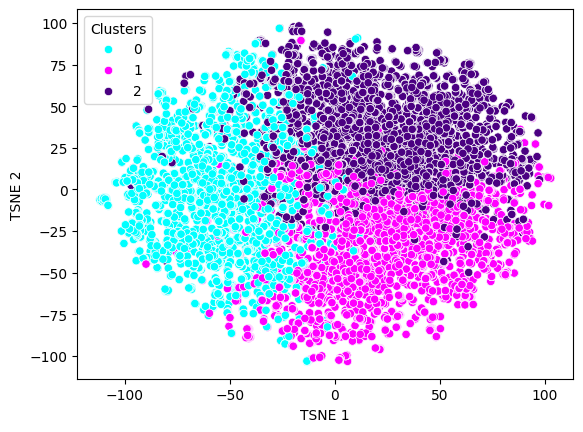

In [32]:
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
import seaborn as sns
import umap
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score
from matplotlib.colors import ListedColormap
from matplotlib import font_manager

font_path = "C:/Users/User/Downloads/deconstructalz.github.io/scott_10k_housekeeping/arial.ttf"
font_manager.fontManager.addfont(font_path)


confounders = ['PTAGE','PTGENDER','FIELD_STRENGTH','GENOTYPE','MMSCORE','CDGLOBAL','NPISCORE',
               'Abeta_40_conc', 'Abeta_42_conc', 'P217_DILUTION_CORRECTED_CONC']


desikan_coeffs = ['desikan_D1', 'desikan_D2', 'desikan_DAT', 'desikan_NET', 'desikan_5HT1A',
                   'desikan_5HT1B', 'desikan_5HT2A', 'desikan_5HT4', 'desikan_5HT6', 'desikan_5HTT',
                   'desikan_a4b2', 'desikan_M1', 'desikan_vAChT', 'desikan_NMDA', 'desikan_mGluR5',
                   'desikan_GABAA/BZ', 'desikan_H3', 'desikan_CB1', 'desikan_MOR']



df = pd.read_csv('C:/Users/User/Downloads/deconstructalz.github.io/scott_10k_housekeeping/sbm_w_vbm_scott10k_alliedhealth.csv',
                 low_memory=False)

three_diag_df = df[df['DIAGNOSIS'].isin([1, 2, 3])].copy()

scaler = StandardScaler()
seed   = 42

color_map      = {1: 'green', 2: 'blue', 3: 'red'}
cluster_colors = {0: 'cyan',  1: 'magenta', 2: 'indigo'}

cmap_data = np.genfromtxt('C:/Users/User/Downloads/deconstructalz.github.io/standards/colourmap.csv',
                          delimiter=',')
cmap_div = ListedColormap(cmap_data)


for cohort in [three_diag_df]:
    diag_vals = sorted(cohort['DIAGNOSIS'].unique())
    k = len(diag_vals)
    filepath_specifics = 'three_diags' if k == 3 else 'two_diags'
    title_specifics = "CN, MCI and AD" if k == 3 else "CN, AD"
    base_dir = f'C:/Users/User/Downloads/deconstructalz.github.io/scott_10k_analysis/clusters/{filepath_specifics}'
        
    print(confounders)
    
    print(f'{filepath_specifics} - desikan_coeffs...')

    # 1. Prepare data

    working_cols = desikan_coeffs + ['DIAGNOSIS'] + confounders
    data_subset  = cohort[working_cols].dropna(subset=desikan_coeffs).reset_index(drop=True)

    y_true     = data_subset['DIAGNOSIS']
    X_unscaled = data_subset[desikan_coeffs].copy()

    # 2. Scale
    X_scaled    = scaler.fit_transform(X_unscaled)
    X_scaled_df = pd.DataFrame(X_scaled, columns=desikan_coeffs) 

    # 3. Cluster
    kmeans         = KMeans(n_clusters=k, random_state=seed)
    cluster_labels = kmeans.fit_predict(X_scaled) 
    sil_score      = silhouette_score(X_scaled, cluster_labels)
    print(f'Silhouette score: {sil_score:.2f}')

    # 4. Attach cluster labels by position

    X_unscaled['Clusters']  = cluster_labels
    X_scaled_df['Clusters'] = cluster_labels

    # 5. Dimensionality reduction
    print('TSNE...')
    tsne_res = TSNE(n_components=2, random_state=seed).fit_transform(X_scaled)

    # 6. Build visualisation dataframe
    viz_df = pd.DataFrame({
        'Clusters':  cluster_labels,
        'DIAGNOSES': y_true.values,
        'TSNE 1':    tsne_res[:, 0], 'TSNE 2': tsne_res[:, 1]
    })
    for conf in [c for c in working_cols if c != 'DIAGNOSIS']:
        viz_df[conf] = data_subset[conf].values # When this is done, confounders are added as columns to viz_df


    # 8. Scatter plots
    d1, d2 = ('TSNE 1', 'TSNE 2')
    method    = d1.split(' ')[0]
    base_path = f'{base_dir}/{method}_k{k}_desikan_coeffs'

In [35]:
viz_df

,Clusters,DIAGNOSES,TSNE 1,TSNE 2,desikan_D1,desikan_D2,desikan_DAT,desikan_NET,desikan_5HT1A,desikan_5HT1B,...,PTAGE,PTGENDER,FIELD_STRENGTH,GENOTYPE,MMSCORE,CDGLOBAL,NPISCORE,Abeta_40_conc,Abeta_42_conc,P217_DILUTION_CORRECTED_CONC
0,1,1.0,-12.259457,-16.620096,0.164895,0.064375,-0.372338,0.020493,-0.156457,-0.029395,...,84.0,1.0,1.5T,03-Apr,28.0,0.0,0.0,NaN,NaN,NaN
1,1,1.0,-12.207213,-16.623972,0.173968,0.075737,-0.409294,-0.002973,-0.186256,-0.016760,...,85.0,1.0,1.5T,03-Apr,28.0,0.0,0.0,NaN,NaN,NaN
2,1,1.0,-12.203652,-16.694035,0.137515,0.071195,-0.341835,-0.009386,-0.169848,-0.039268,...,85.0,1.0,1.5T,03-Apr,30.0,0.0,0.0,NaN,NaN,NaN
3,1,1.0,-12.157530,-16.821928,0.145770,0.041716,-0.348116,-0.008538,-0.190695,-0.030421,...,85.0,1.0,1.5T,03-Apr,30.0,0.0,0.0,NaN,NaN,NaN
4,1,1.0,-12.246937,-16.601395,0.162485,0.084038,-0.405867,-0.002199,-0.177578,-0.031257,...,87.0,1.0,1.5T,03-Apr,29.0,0.0,0.0,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11921,0,1.0,-43.002369,21.720097,0.050939,0.124775,0.027179,0.040810,-0.305558,-0.236311,...,63.0,1.0,3T,02-Mar,27.0,0.0,NaN,NaN,NaN,NaN
11922,2,1.0,3.323988,57.842323,0.060754,0.043733,-0.271572,0.210937,0.084235,-0.040495,...,70.0,1.0,3T,03-Mar,29.0,0.0,NaN,NaN,NaN,NaN
11923,2,2.0,34.648964,31.857670,0.095987,-0.326157,0.052471,0.063205,0.027468,-0.183576,...,69.0,2.0,3T,02-Mar,29.0,0.5,NaN,NaN,NaN,NaN
11924,1,1.0,36.379868,-18.214699,-0.025574,-0.017051,0.138570,-0.074845,-0.115863,-0.070223,...,66.0,1.0,3T,NaN,28.0,0.0,NaN,NaN,NaN,NaN


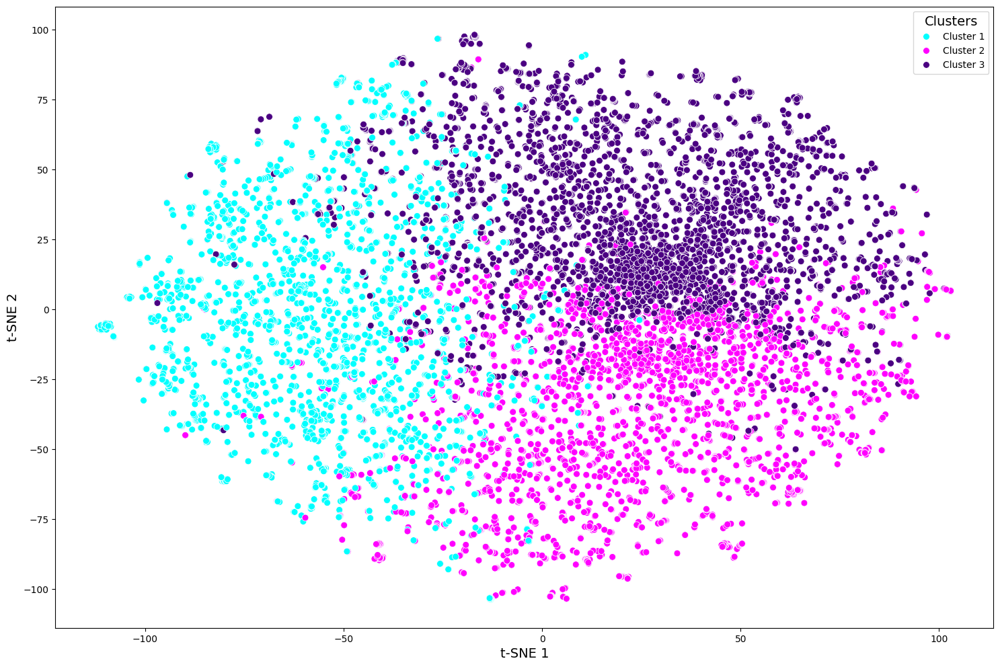

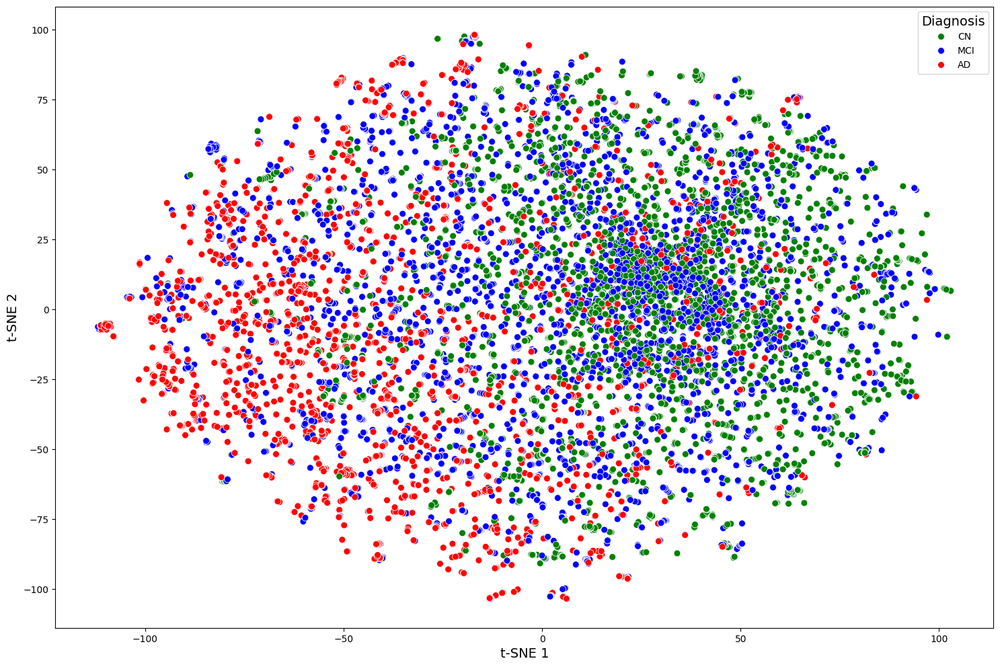

desikan_5HT1A is a desikan coefficient
Color limits for desikan_5HT1A: vmin=-0.42, vmax=0.25


<Figure size 1800x1200 with 0 Axes>

<Figure size 1800x900 with 0 Axes>

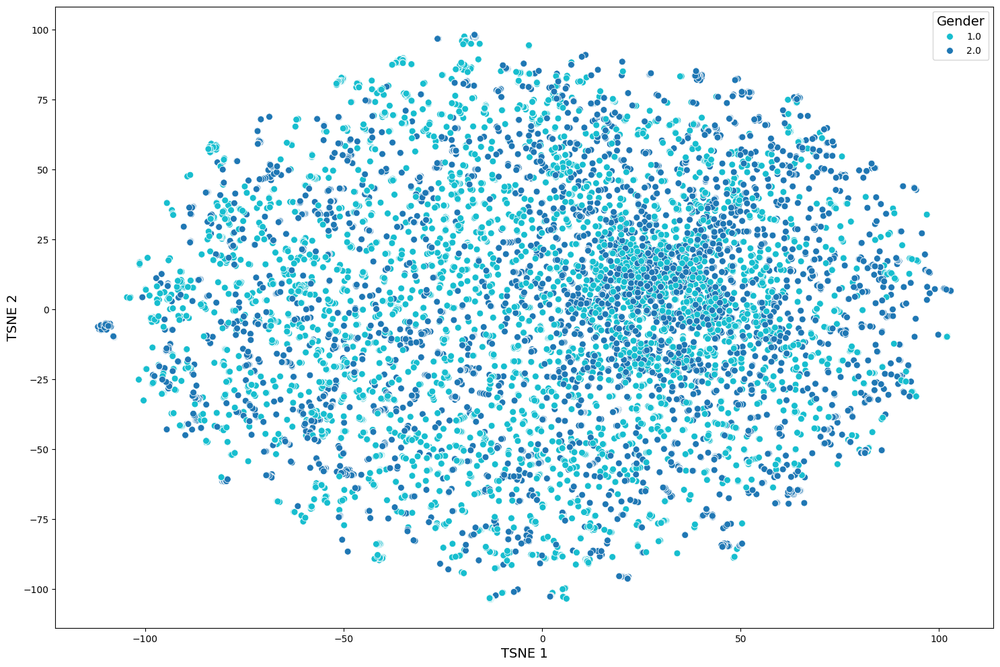

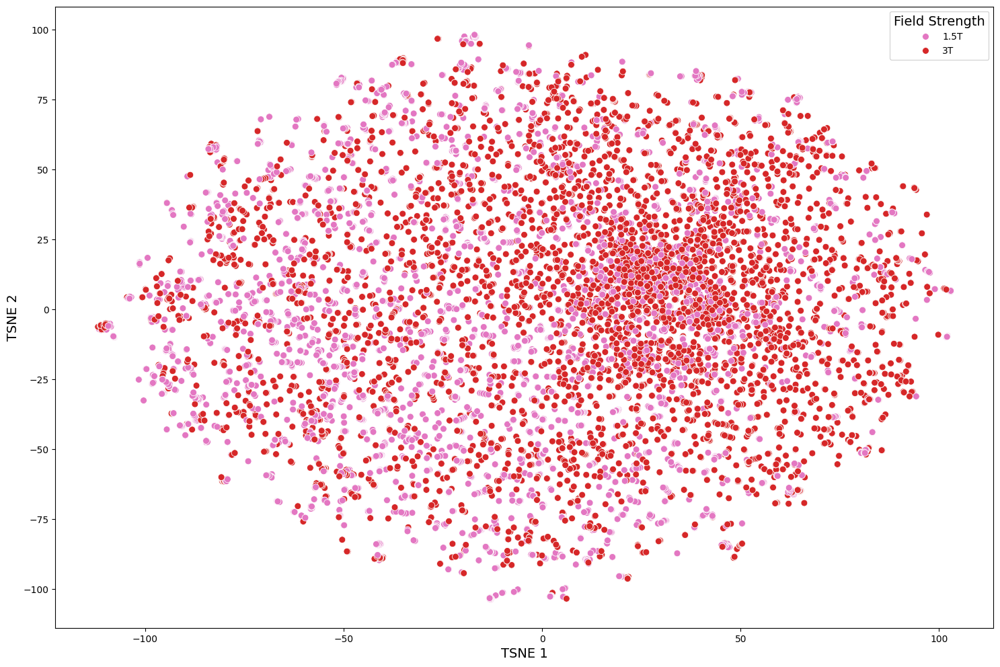

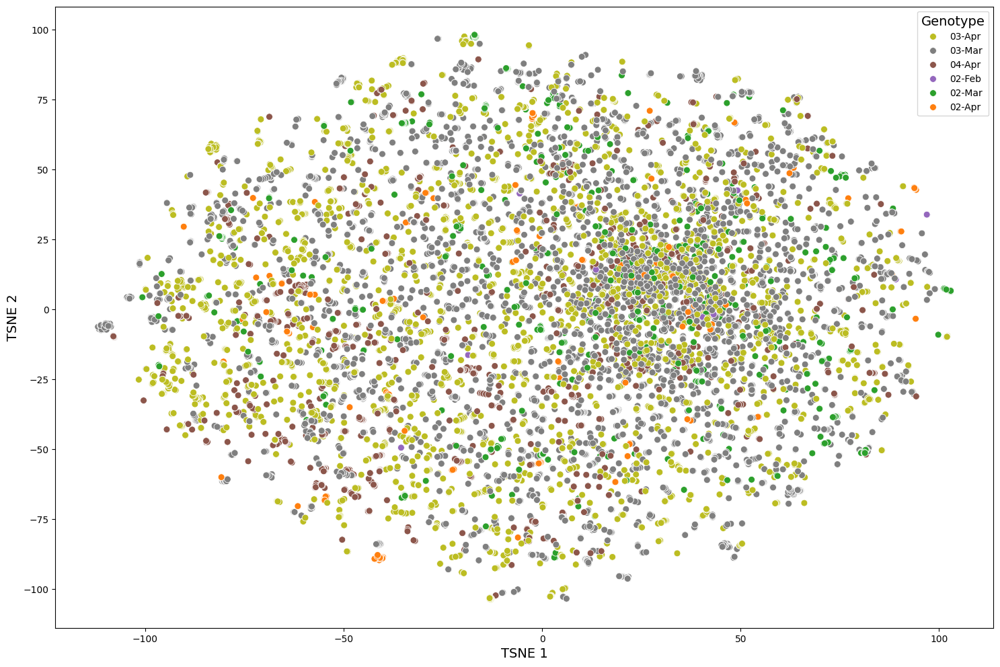

<Figure size 1800x1200 with 0 Axes>

<Figure size 1800x900 with 0 Axes>

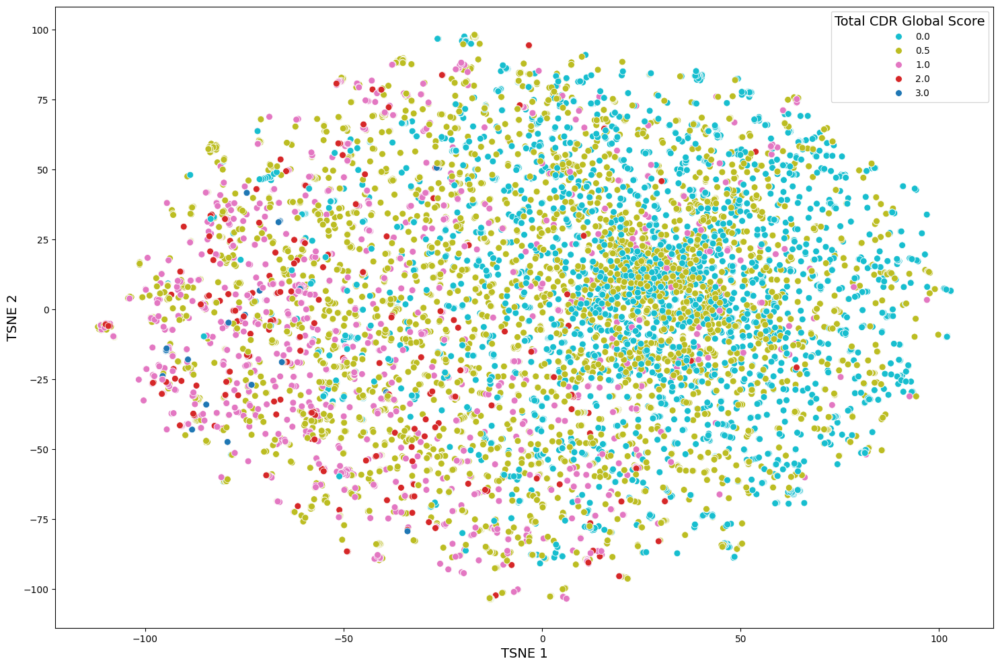

<Figure size 1800x1200 with 0 Axes>

<Figure size 1800x900 with 0 Axes>

<Figure size 1800x1200 with 0 Axes>

<Figure size 1800x900 with 0 Axes>

<Figure size 1800x1200 with 0 Axes>

<Figure size 1800x900 with 0 Axes>

<Figure size 1800x1200 with 0 Axes>

<Figure size 1800x900 with 0 Axes>

<Figure size 1800x1200 with 0 Axes>

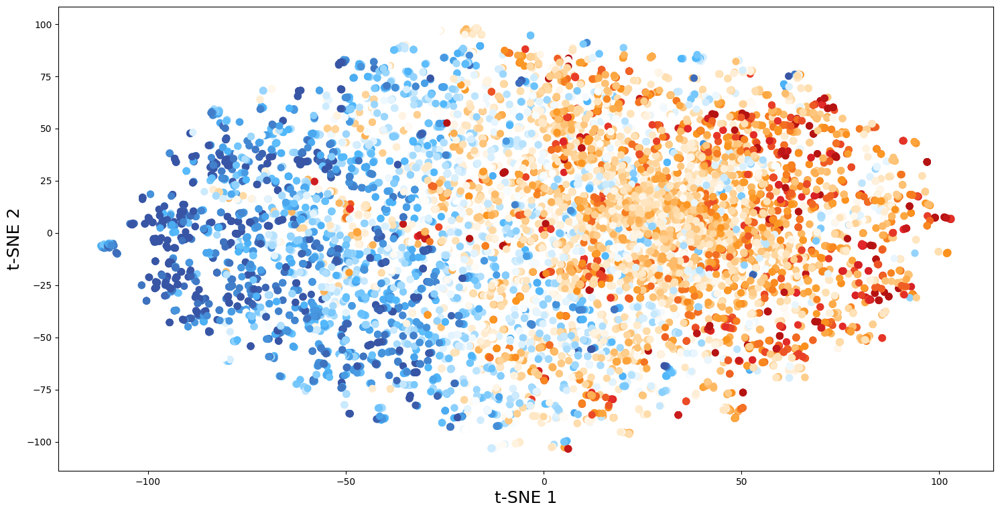

desikan_H3 is a desikan coefficient
Color limits for desikan_H3: vmin=-0.29, vmax=0.46


<Figure size 1800x1200 with 0 Axes>

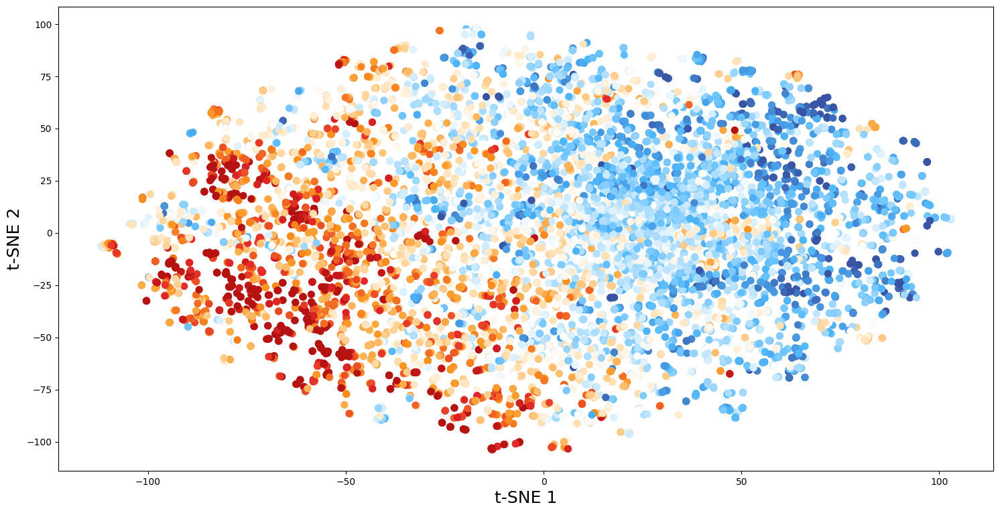

desikan_mGluR5 is a desikan coefficient
Color limits for desikan_mGluR5: vmin=-0.60, vmax=0.80


<Figure size 1800x1200 with 0 Axes>

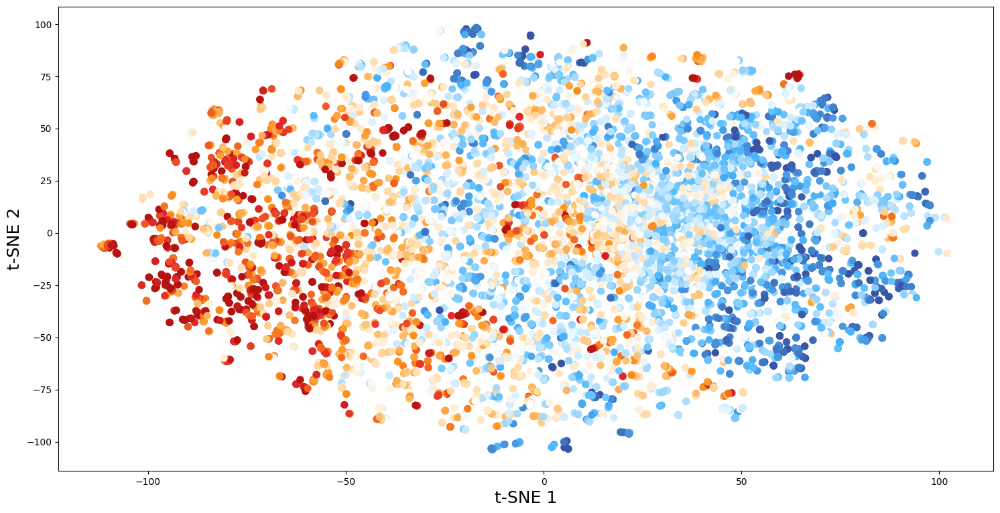

In [102]:
font_path = "C:/Users/User/Downloads/deconstructalz.github.io/scott_10k_housekeeping/arial.ttf"
font_manager.fontManager.addfont(font_path)
color_map      = {1: 'green', 2: 'blue', 3: 'red'}
cluster_colors = {0: 'cyan',  1: 'magenta', 2: 'indigo'}

plt.figure(figsize = (18, 12))
ax = sns.scatterplot(data=viz_df, x=d1, y=d2, hue='Clusters', palette = cluster_colors, s = 50)
handles, labels = ax.get_legend_handles_labels()
# map legend labels (which are cluster identifiers) to more readable text, keep lengths matched
new_labels = []
for lab in labels:
    try:
        new_labels.append(f'Cluster {int(float(lab)) + 1}')
    except Exception:
        new_labels.append(lab)
leg = ax.legend(handles=handles, labels=new_labels, loc='upper right', title='Clusters')
plt.setp(leg.get_title(),fontsize = 14)
ax.set_xlabel(f't-SNE 1', fontsize = 14)
ax.set_ylabel(f't-SNE 2', fontsize = 14)
plt.show()

plt.figure(figsize = (18, 12))
ax = sns.scatterplot(data=viz_df, x=d1, y=d2, hue='DIAGNOSES', palette = color_map, s = 50)
handles, labels = ax.get_legend_handles_labels()
leg = plt.legend(handles, ['CN', 'MCI', 'AD'], loc='upper right', title='Diagnosis')
plt.setp(leg.get_title(),fontsize = 14)
ax.set_xlabel(f't-SNE 1', fontsize = 14)
ax.set_ylabel(f't-SNE 2', fontsize = 14)
plt.show()

conf_title_map = {
    'PTAGE': 'Age',
    'PTGENDER': 'Gender',
    'FIELD_STRENGTH': 'Field Strength',
    'GENOTYPE': 'Genotype',
    'MMSCORE': 'Total MMSE Score',
    'CDGLOBAL': 'Total CDR Global Score',
    'NPISCORE': 'Total NPI Score',
    'Abeta_40_conc': 'Abeta 40 Concentration',
    'Abeta_42_conc': 'Abeta 42 Concentration',
    'P217_DILUTION_CORRECTED_CONC': 'P217 Dilution Corrected Concentration',
    'desikan_D1': 'D1',
    'desikan_D2': 'D2',
    'desikan_DAT': 'DAT',
    'desikan_NET': 'NET',
    'desikan_5HT1A': '5HT1A beta coefficient values within 2 standard deviations of the mean',
    'desikan_5HT1B': '5HT1B',
    'desikan_5HT2A': '5HT2A',
    'desikan_5HT4': '5HT4',
    'desikan_5HT6': '5HT6',
    'desikan_5HTT': '5HTT',
    'desikan_a4b2': 'a4b2',
    'desikan_M1': 'M1',
    'desikan_vAChT': 'vAChT',
    'desikan_NMDA': 'NMDA',
    'desikan_mGluR5': 'mGluR5 beta coefficient values within 2 standard deviations of the mean',
    'desikan_GABAA/BZ': 'GABAA/BZ',
    'desikan_H3': 'H3 beta coefficient values within 2 standard deviations of the mean',
    'desikan_CB1': 'CB1',
    'desikan_MOR': 'MOR'
}
    # C. Colour by confounder
for conf in ['PTAGE','PTGENDER','FIELD_STRENGTH','GENOTYPE','MMSCORE','CDGLOBAL','NPISCORE', 'Abeta_40_conc', 'Abeta_42_conc', 'P217_DILUTION_CORRECTED_CONC', 'desikan_5HT1A', 'desikan_H3', 'desikan_mGluR5']:
    plt.figure(figsize=(18, 12))
    if viz_df[conf].dtype == 'object' or viz_df[conf].nunique() < 10:
        ax = sns.scatterplot(data=viz_df, x=d1, y=d2, hue=conf, palette = 'tab10_r', s = 50)
        handles, labels = ax.get_legend_handles_labels()
        # ensure legend() receives both handles and corresponding labels
        leg = ax.legend(handles=handles, labels=labels, loc='upper right', title=conf_title_map[conf])
        plt.setp(leg.get_title(),fontsize = 14)
        ax.set_xlabel(f'TSNE 1', fontsize = 14)
        ax.set_ylabel(f'TSNE 2', fontsize = 14)
        # plt.legend(loc='center left', bbox_to_anchor=(1, 0.8), ncol=1, title = conf)
    else:
        plt.figure(figsize=(18, 9))
        # plt.scatter(viz_df[d1], viz_df[d2], c=viz_df[conf], cmap = 'RdBu_r', s=50)
        if conf in desikan_coeffs:
            print(f'{conf} is a desikan coefficient')
            plt.scatter(viz_df[d1], viz_df[d2], c=viz_df[conf], cmap = cmap_div, s=50)
            vmin = viz_df[conf].mean() - (2 * viz_df[conf].std())
            vmax = viz_df[conf].mean() + (2 * viz_df[conf].std())
            plt.clim(vmin, vmax)
            print(f'Color limits for {conf}: vmin={vmin:.2f}, vmax={vmax:.2f}')
            #plt.colorbar(label = conf_title_map[conf])
            plt.xlabel(f't-SNE 1', fontsize = 18)
            plt.ylabel(f't-SNE 2', fontsize = 18)
            plt.show()
            plt.close()

desikan_5HT1A is a desikan coefficient
Color limits for desikan_5HT1A: vmin=-0.42, vmax=0.25


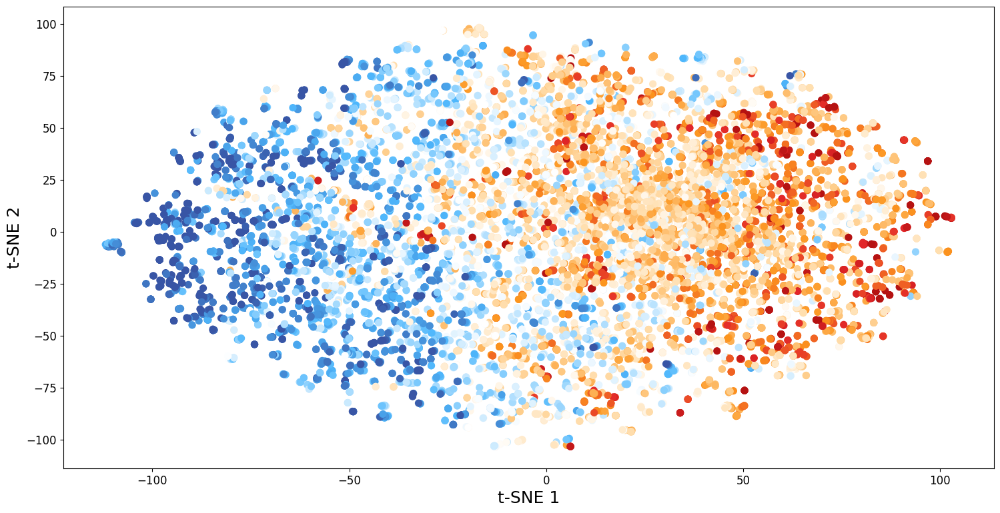

desikan_H3 is a desikan coefficient
Color limits for desikan_H3: vmin=-0.29, vmax=0.46


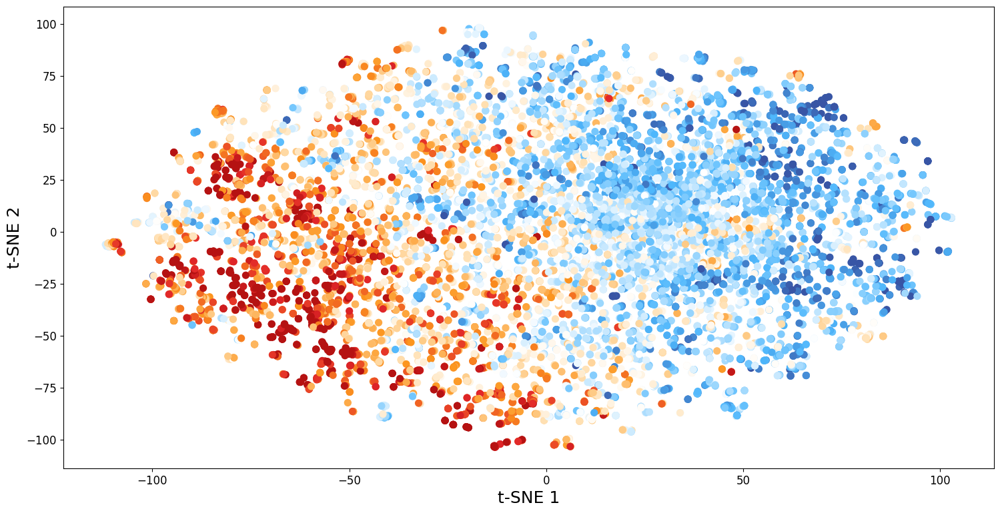

desikan_mGluR5 is a desikan coefficient
Color limits for desikan_mGluR5: vmin=-0.60, vmax=0.80


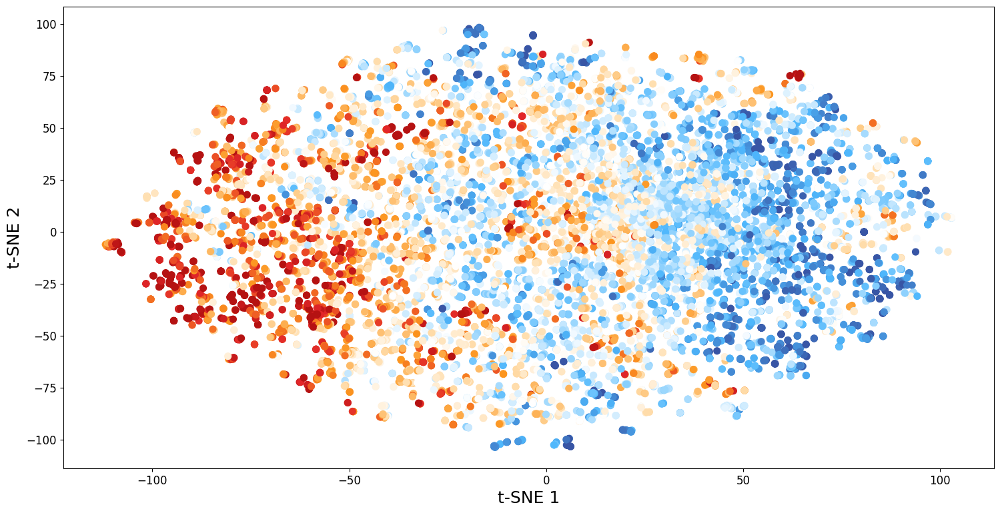

In [98]:
for conf in ['PTAGE','PTGENDER','FIELD_STRENGTH','GENOTYPE','MMSCORE','CDGLOBAL','NPISCORE', 'Abeta_40_conc', 'Abeta_42_conc', 'P217_DILUTION_CORRECTED_CONC', 'desikan_5HT1A', 'desikan_H3', 'desikan_mGluR5']:    
    if conf in desikan_coeffs:
        print(f'{conf} is a desikan coefficient')
        plt.figure(figsize=(18, 9))
        plt.scatter(viz_df[d1], viz_df[d2], c=viz_df[conf], cmap = cmap_div, s=50)
        vmin = viz_df[conf].mean() - (2 * viz_df[conf].std())
        vmax = viz_df[conf].mean() + (2 * viz_df[conf].std())
        plt.clim(vmin, vmax)
        print(f'Color limits for {conf}: vmin={vmin:.2f}, vmax={vmax:.2f}')
        #plt.colorbar(label = conf_title_map[conf])
        plt.xlabel(f't-SNE 1', fontsize = 18)
        plt.ylabel(f't-SNE 2', fontsize = 18)
        plt.setp(plt.gca().get_xticklabels(), fontsize=12)
        plt.setp(plt.gca().get_yticklabels(), fontsize=12)
        plt.show()
        plt.close()

In [8]:
import pandas as pd, os, numpy as np
import scipy.stats as stats
from scipy.stats import ttest_rel, kstest, levene, wilcoxon

root_dir = 'C:/Users/User/Downloads/deconstructalz.github.io/scott_10k_analysis/classifiers/'

files = os.listdir(root_dir)
print([file for file in files if 'cb_df_far' in file and 'metrics' in file and file.endswith('.csv')])

non_fs = pd.read_csv('C:/Users/User/Downloads/deconstructalz.github.io/scott_10k_analysis/classifiers/fold_metrics_cb_df_far.csv', low_memory = False)
fs = pd.read_csv('C:/Users/User/Downloads/deconstructalz.github.io/scott_10k_analysis/classifiers/feature_selected_fold_metrics_feature_selected_cb_df_far.csv', low_memory = False)
comb_df = pd.concat([non_fs, fs], axis = 1)
accs = comb_df[['Cb_df_far LR accuracy', 'Cb_df_far XGB accuracy']]
f1s = comb_df[['Cb_df_far LR F1', 'Cb_df_far XGB F1']]
sensitivities = comb_df[['Cb_df_far LR Sensitivity', 'Cb_df_far XGB Sensitivity']]
aucprs = comb_df[['Cb_df_far LR AUC-PR', 'Cb_df_far XGB AUC-PR']]

for metric in [accs, f1s, sensitivities, aucprs]:

        grp1 = metric.iloc[:, 0].values
        grp2 = metric.iloc[:, 1].values

        # 1. Levene's Test for Homogeneity of Variance
        _, p_levene = levene(grp1, grp2)
        equal_var = p_levene > 0.05

        # 2. Kolmogorov-Smirnov Test for Normality (standardized)
        is_normal = True
        for g in [grp1, grp2]:
            standardised_group = (g - g.mean()) / g.std()
            _, p_ks = kstest(standardised_group, 'norm')
            if p_ks < 0.05:
                is_normal = False
                break

        # 3. Pairwise test
        if is_normal and equal_var:
            test_name = "Paired t-test"
            result = ttest_rel(grp1, grp2)
        elif is_normal and not equal_var:
            test_name = "Paired t-test"
            result = ttest_rel(grp1, grp2, equal_var=False)
        else:
            test_name = "wilcoxon signed-rank test"
            result = wilcoxon(grp1, grp2)
        print(f"{test_name} result: statistic={result.statistic}, p-value={result.pvalue}, {result.pvalue * 4}")

['feature_selected_fold_metrics_feature_selected_cb_df_far.csv', 'fold_metrics_cb_df_far.csv']
Paired t-test result: statistic=-1.4293547783707166, p-value=0.2261153161191265, 0.904461264476506
Paired t-test result: statistic=2.9865284818196636, p-value=0.04047671841649262, 0.16190687366597048
Paired t-test result: statistic=3.7650813671382597, p-value=0.019688070246046265, 0.07875228098418506
Paired t-test result: statistic=4.506593336490886, p-value=0.010768073883046072, 0.043072295532184286


In [7]:
import pandas as pd, os, numpy as np
import scipy.stats as stats
from scipy.stats import ttest_rel, kstest, levene, wilcoxon

root_dir = 'C:/Users/User/Downloads/deconstructalz.github.io/scott_10k_analysis/classifiers/'

files = os.listdir(root_dir)
print([file for file in files if 'cb_df_far' in file and 'metrics' in file and file.endswith('.csv')])

non_fs = pd.read_csv('C:/Users/User/Downloads/deconstructalz.github.io/scott_10k_analysis/classifiers/fold_metrics_cb_df_far.csv', low_memory = False)
fs = pd.read_csv('C:/Users/User/Downloads/deconstructalz.github.io/scott_10k_analysis/classifiers/feature_selected_fold_metrics_feature_selected_cb_df_far.csv', low_memory = False)
comb_df = pd.concat([non_fs, fs], axis = 1)
accs = comb_df[['Feature_selected_cb_df_far_fs LR accuracy', 'Feature_selected_cb_df_far_fs XGB accuracy']]
f1s = comb_df[['Feature_selected_cb_df_far_fs LR F1', 'Feature_selected_cb_df_far_fs XGB F1']]
sensitivities = comb_df[['Feature_selected_cb_df_far_fs LR Sensitivity', 'Feature_selected_cb_df_far_fs XGB Sensitivity']]
aucprs = comb_df[['Feature_selected_cb_df_far_fs LR AUC-PR', 'Feature_selected_cb_df_far_fs XGB AUC-PR']]

for metric in [accs, f1s, sensitivities, aucprs]:

        grp1 = metric.iloc[:, 0].values
        grp2 = metric.iloc[:, 1].values

        # 1. Levene's Test for Homogeneity of Variance
        _, p_levene = levene(grp1, grp2)
        equal_var = p_levene > 0.05

        # 2. Kolmogorov-Smirnov Test for Normality (standardized)
        is_normal = True
        for g in [grp1, grp2]:
            standardised_group = (g - g.mean()) / g.std()
            _, p_ks = kstest(standardised_group, 'norm')
            if p_ks < 0.05:
                is_normal = False
                break

        # 3. Pairwise test
        if is_normal and equal_var:
            test_name = "Paired t-test"
            result = ttest_rel(grp1, grp2)
        elif is_normal and not equal_var:
            test_name = "Paired t-test"
            result = ttest_rel(grp1, grp2, equal_var=False)
        else:
            test_name = "wilcoxon signed-rank test"
            result = wilcoxon(grp1, grp2)
        print(f"{test_name} result: statistic={result.statistic}, p-value={result.pvalue}, {result.pvalue * 4}")

['feature_selected_fold_metrics_feature_selected_cb_df_far.csv', 'fold_metrics_cb_df_far.csv']
Paired t-test result: statistic=-1.0093878215549823, p-value=0.3698894338779716, 1.4795577355118863
Paired t-test result: statistic=2.030007639613998, p-value=0.11221172505327942, 0.4488469002131177
Paired t-test result: statistic=3.543126173298933, p-value=0.023946010615166897, 0.09578404246066759
Paired t-test result: statistic=2.2630888881357665, p-value=0.08638488425417547, 0.34553953701670187


In [9]:
import pandas as pd, os, numpy as np
import scipy.stats as stats
from scipy.stats import ttest_rel, kstest, levene, wilcoxon

root_dir = 'C:/Users/User/Downloads/deconstructalz.github.io/scott_10k_analysis/classifiers/'

files = os.listdir(root_dir)
print([file for file in files if 'cb_df_far' in file and 'metrics' in file and file.endswith('.csv')])

non_fs = pd.read_csv('C:/Users/User/Downloads/deconstructalz.github.io/scott_10k_analysis/classifiers/fold_metrics_cb_df_far.csv', low_memory = False)
fs = pd.read_csv('C:/Users/User/Downloads/deconstructalz.github.io/scott_10k_analysis/classifiers/feature_selected_fold_metrics_feature_selected_cb_df_far.csv', low_memory = False)
comb_df = pd.concat([non_fs, fs], axis = 1)
accs = comb_df[['Feature_selected_cb_df_far_fs LR accuracy', 'Cb_df_far LR accuracy']]
f1s = comb_df[['Feature_selected_cb_df_far_fs LR F1', 'Cb_df_far LR F1']]
sensitivities = comb_df[['Feature_selected_cb_df_far_fs LR Sensitivity', 'Cb_df_far LR Sensitivity']]
aucprs = comb_df[['Feature_selected_cb_df_far_fs LR AUC-PR', 'Cb_df_far LR AUC-PR']]

for metric in [accs, f1s, sensitivities, aucprs]:

        grp1 = metric.iloc[:, 0].values
        grp2 = metric.iloc[:, 1].values

        # 1. Levene's Test for Homogeneity of Variance
        _, p_levene = levene(grp1, grp2)
        equal_var = p_levene > 0.05

        # 2. Kolmogorov-Smirnov Test for Normality (standardized)
        is_normal = True
        for g in [grp1, grp2]:
            standardised_group = (g - g.mean()) / g.std()
            _, p_ks = kstest(standardised_group, 'norm')
            if p_ks < 0.05:
                is_normal = False
                break

        # 3. Pairwise test
        if is_normal and equal_var:
            test_name = "Paired t-test"
            result = ttest_rel(grp1, grp2)
        elif is_normal and not equal_var:
            test_name = "Paired t-test"
            result = ttest_rel(grp1, grp2, equal_var=False)
        else:
            test_name = "wilcoxon signed-rank test"
            result = wilcoxon(grp1, grp2)
        print(f"{test_name} result: statistic={result.statistic}, p-value={result.pvalue}, {result.pvalue * 4}")

['feature_selected_fold_metrics_feature_selected_cb_df_far.csv', 'fold_metrics_cb_df_far.csv']
Paired t-test result: statistic=0.003285476633646636, p-value=0.9975358980660941, 3.9901435922643764
Paired t-test result: statistic=0.6381701154381011, p-value=0.5580677299717387, 2.232270919886955
Paired t-test result: statistic=0.7873859593740453, p-value=0.4750904756388328, 1.900361902555331
Paired t-test result: statistic=0.8871150659674368, p-value=0.42513667905843494, 1.7005467162337398


In [30]:
non_fs = pd.read_csv('C:/Users/User/Downloads/deconstructalz.github.io/scott_10k_analysis/classifiers/fold_metrics_cb_df_far.csv', low_memory = False)
fs = pd.read_csv('C:/Users/User/Downloads/deconstructalz.github.io/scott_10k_analysis/classifiers/feature_selected_fold_metrics_feature_selected_cb_df_far.csv', low_memory = False)
comb_df = pd.concat([non_fs, fs], axis = 1)

means = comb_df.mean().round(2)
stds = comb_df.std().round(2)

metrics_summary = pd.DataFrame({
    'Mean': means,
    'Std Dev': stds
})
m = metrics_summary.transpose()
print(m)
#print(m[[col for col in m.columns if 'LR' in col.split(' ')]])
#print(m[[col for col in metrics_summary.columns if 'LR' in col.split(' ')]])

         Cb_df_far LR accuracy  Cb_df_far XGB accuracy  Cb_df_far LR F1  \
Mean                      0.68                    0.68             0.55   
Std Dev                   0.03                    0.03             0.04   

         Cb_df_far XGB F1  Cb_df_far LR Sensitivity  \
Mean                 0.46                      0.62   
Std Dev              0.02                      0.06   

         Cb_df_far XGB Sensitivity  Cb_df_far LR AUC-PR  Cb_df_far XGB AUC-PR  \
Mean                          0.43                 0.55                  0.48   
Std Dev                       0.09                 0.09                  0.08   

         Feature_selected_cb_df_far_fs LR accuracy  \
Mean                                          0.68   
Std Dev                                       0.03   

         Feature_selected_cb_df_far_fs XGB accuracy  \
Mean                                           0.69   
Std Dev                                        0.05   

         Feature_selected_cb_df_far

In [36]:
non_fs = pd.read_csv('C:/Users/User/Downloads/deconstructalz.github.io/scott_10k_analysis/classifiers/fold_metrics_cb_df_far.csv', low_memory = False)
accs = non_fs[[col for col in non_fs.columns.tolist() if 'accuracy' in col]]
f1s = non_fs[[col for col in non_fs.columns.tolist() if 'F1' in col]]
sensitivities = non_fs[[col for col in non_fs.columns.tolist() if 'Sensitivity' in col]]
aucprs = non_fs[[col for col in non_fs.columns.tolist() if 'AUC-PR' in col]]
print(accs.mean())
for metric in [accs, f1s, sensitivities, aucprs]:
    print(metric.mean().idxmax(), metric.mean().max())

Cb_df_far LR accuracy     0.675324
Cb_df_far XGB accuracy    0.683668
dtype: float64
Cb_df_far XGB accuracy 0.6836679620034541
Cb_df_far LR F1 0.546127106416779
Cb_df_far LR Sensitivity 0.6193618860149527
Cb_df_far LR AUC-PR 0.5525835558259804


In [39]:
fs = pd.read_csv('C:/Users/User/Downloads/deconstructalz.github.io/scott_10k_analysis/classifiers/feature_selected_fold_metrics_feature_selected_cb_df_far.csv', low_memory = False)
accs = fs[[col for col in fs.columns.tolist() if 'accuracy' in col]]
f1s = fs[[col for col in fs.columns.tolist() if 'F1' in col]]
sensitivities = fs[[col for col in fs.columns.tolist() if 'Sensitivity' in col]]
aucprs = fs[[col for col in fs.columns.tolist() if 'AUC-PR' in col]]
print(accs.mean())

for metric in [accs, f1s, sensitivities, aucprs]:
    print(metric.mean().idxmax(), metric.mean().max())

print(fs['Feature_selected_cb_df_far_fs XGB accuracy'].mean().round(2), fs['Feature_selected_cb_df_far_fs XGB accuracy'].std().round(2))

Feature_selected_cb_df_far_fs LR accuracy     0.675329
Feature_selected_cb_df_far_fs XGB accuracy    0.687835
dtype: float64
Feature_selected_cb_df_far_fs XGB accuracy 0.6878346286701208
Feature_selected_cb_df_far_fs LR F1 0.5482537074050059
Feature_selected_cb_df_far_fs LR Sensitivity 0.6243898824611602
Feature_selected_cb_df_far_fs LR AUC-PR 0.5531659845435397
0.69 0.05


In [109]:
rootdir = 'C:/Users/User/Downloads/deconstructalz.github.io/scott_10k_analysis/sig_diff'
for x in  ['destrieux_coeffs_sig_diff.csv', 'flipped_destrieux_coeffs_sig_diff.csv', 'desikan_coeffs_sig_diff.csv', 'flipped_desikan_coeffs_sig_diff.csv']:
    if x.endswith('.csv'):
        print(x)
        list_to_show = []
        df = pd.read_csv(os.path.join(rootdir, x))
        if 'Higher Mean' in df.columns.tolist():
            for i, row in df.iterrows():
                if row['Significant'] == True:
                    list_to_show.append((row['Higher Mean'].split(' ')[-1]))
                else:
                    list_to_show.append(' ')
            print(list_to_show)

destrieux_coeffs_sig_diff.csv
['↑', '↑', '↓', '↑', '↓', '↑', '↑', ' ', '↑', '↓', ' ', '↓', '↓', ' ', '↑', '↑', '↑', '↓', '↓']
flipped_destrieux_coeffs_sig_diff.csv
['↓', '↑', '↓', '↑', ' ', '↓', '↑', '↑', '↑', '↓', '↑', '↑', ' ', '↓', '↑', ' ', '↑', '↓', '↓']
desikan_coeffs_sig_diff.csv
['↑', '↑', '↓', ' ', '↓', ' ', '↑', ' ', '↑', '↓', ' ', '↓', '↓', '↓', '↑', ' ', '↑', '↓', '↓']
flipped_desikan_coeffs_sig_diff.csv
['↓', '↑', ' ', '↓', '↑', '↓', '↑', '↑', ' ', '↓', '↑', '↑', '↓', '↓', ' ', ' ', '↑', ' ', '↓']
